# notebook to plot object metadata and sample composition 

In [1]:
# fine annotate lineage 
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import os,sys
import anndata
sc.logging.print_header()


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.3 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.10 pynndescent==0.5.6


# Load large object pre QC

In [2]:
h5ad_file = '/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/annotation_done/HTSA_v17.h5ad'
adata_full = sc.read_h5ad(h5ad_file)

In [5]:
adata_full

AnnData object with n_obs × n_vars = 503468 × 36751
    obs: 'age_group', 'age_numeric', 'annotation_level_0', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'backup_barcode', 'barcode_sequence', 'batch', 'bh_pval', 'c_call_VDJ', 'c_call_VDJ_main', 'c_call_VJ', 'c_call_VJ_main', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'c_call_gdT_VDJ', 'c_call_gdT_VJ', 'cc_phase', 'chain_status', 'chemistry', 'chemistry_simple', 'cite_w_protein', 'clone_id', 'clone_id_by_size', 'cluster_scrublet_score', 'ctp_pred', 'ctp_pred_prob', 'ctp_pred_uncertain', 'd_call_VDJ', 'd_call_VDJ_main', 'd_call_abT_VDJ', 'd_call_abT_VDJ_main', 'donor', 'doublet_score', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'enrichment', 'enzyme', 'g2m_Score', 'good_qc_cluster_mito20', 'has_contig', 'isotype', 'isotype_status', 'j_call_VDJ', 'j_call_VDJ_main', 'j_call_VJ', 'j_call_VJ_main', 'j_call_abT_VDJ', 'j_call_abT_VDJ_main', 'j_call_abT_VJ', 'j_call_abT_VJ_main', 'j_call_gdT_VDJ', 'j_call_gdT_VDJ_main',

In [6]:
# correct donor name 
adata_full.obs['donor'] = adata_full.obs['donor'] .astype('object')
adata_full.obs['donor'].loc[np.array(adata_full.obs['donor'] == 'Z6')] = 'T06'
adata_full.obs['donor'] = adata_full.obs['donor'] .astype('category')
adata_full.obs['donor']

/tmp/ipykernel_392/545200974.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_full.obs['donor'].loc[np.array(adata_full.obs['donor'] == 'Z6')] = 'T06'


barcode
F23_TH_45P-TACTTACCAAGGTGTG    F23
F23_TH_45P-GTGCAGCTCACCGGGT    F23
F23_TH_45P-GAATAAGTCCTCGCAT    F23
F23_TH_45P-CAACCAAAGTGAAGTT    F23
F23_TH_45P-ATTATCCAGAGTCTGG    F23
                              ... 
TA13072427-GACCTGGTCGTTTAGG    U48
TA13072427-TAGTGGTAGTGGGTTG    U48
TA13072427-CGTCACTTCTCGAGTA    U48
TA13072427-AGAGTGGAGTAGCCGA    U48
TA13072427-CGTAGCGGTGTGTGCC    U48
Name: donor, Length: 503468, dtype: category
Categories (31, object): ['F21', 'F23', 'F29', 'F30', ..., 'baut4', 'baut5', 'baut6', 'camp1']

In [7]:
import seaborn as sns
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props

In [8]:
sc.set_figure_params(figsize=[7,3],fontsize=6,dpi=100)

def plot_cluster_proportions(cluster_props, 
                             cluster_palette='tab10',
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    # ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    ax.grid(False)
    return fig
    

In [27]:
cluster = 'study'
sample = 'sex'
props = get_cluster_proportions(adata_full,
                            cluster_key=cluster,
                            sample_key=sample,
                            drop_values=None)

/tmp/ipykernel_392/845850337.py:29: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout()


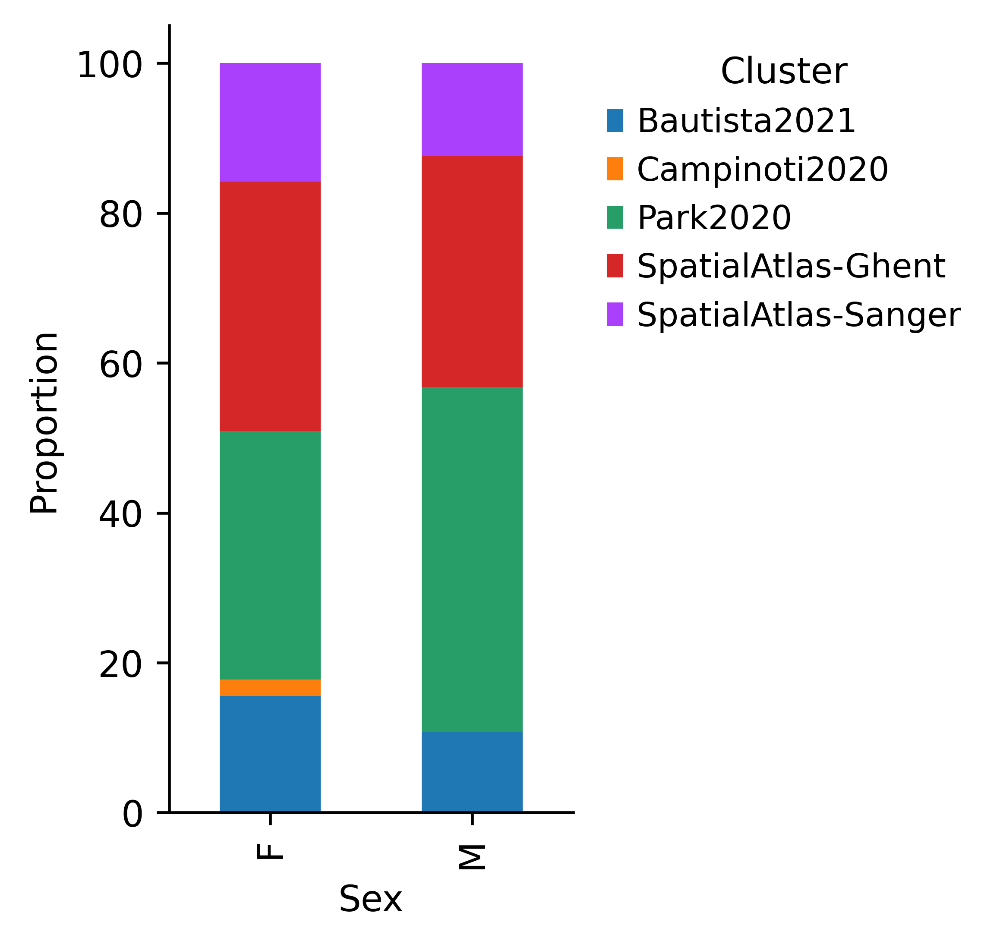

In [29]:
sc.set_figure_params(figsize=[2,4],fontsize=10,dpi=100)
import matplotlib.pyplot as plt
fig = plot_cluster_proportions(props, 
                             cluster_palette=None,
                             xlabel_rotation=0)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/manuscript/supplementary_figures/')
fig.savefig('s1_'+cluster+'_'+sample+'.pdf')

In [4]:
# Load post QC full object

In [2]:
h5ad_file = '/nfs/team205/ny1/ThymusSpatialAtlas/Figure1/annotation_done/Thymus_Atlas_v16_postQC.h5ad'
adata_full = sc.read_h5ad(h5ad_file)

In [5]:
adata_full

AnnData object with n_obs × n_vars = 503468 × 36751
    obs: 'n_genes', 'sample_barcode', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 

# compare fetal and paed T

In [6]:
adata_full.obs['annotation_level_1']

barcode
F23_TH_45P-TACTTACCAAGGTGTG    Phagocytic
F23_TH_45P-GTGCAGCTCACCGGGT          T_DP
F23_TH_45P-GAATAAGTCCTCGCAT          T_DP
F23_TH_45P-CAACCAAAGTGAAGTT          T_DP
F23_TH_45P-ATTATCCAGAGTCTGG          T_DP
                                  ...    
TA13072427-GACCTGGTCGTTTAGG          T_SP
TA13072427-TAGTGGTAGTGGGTTG          T_SP
TA13072427-CGTCACTTCTCGAGTA          T_DP
TA13072427-AGAGTGGAGTAGCCGA          T_DP
TA13072427-CGTAGCGGTGTGTGCC          T_SP
Name: annotation_level_1, Length: 503468, dtype: category
Categories (10, object): ['B', 'Endothelial', 'Epithelial', 'Fibroblast', ..., 'T_DP', 'T_SP', 'blood', 'unassigned']

In [7]:
adata = adata_full[adata_full.obs['annotation_level_1']=='Epithelial']
adata

View of AnnData object with n_obs × n_vars = 25980 × 36751
    obs: 'n_genes', 'sample_barcode', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spl

In [ ]:
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/')
import scvi_wrapper
adata_full = scvi_wrapper.scvi_wrapper_basic(adata_full,categorical_covariate_keys=['chemistry_simple','type','study','enrichment'],continuous_covariate_keys=['age_numeric'],batch_key='sample')

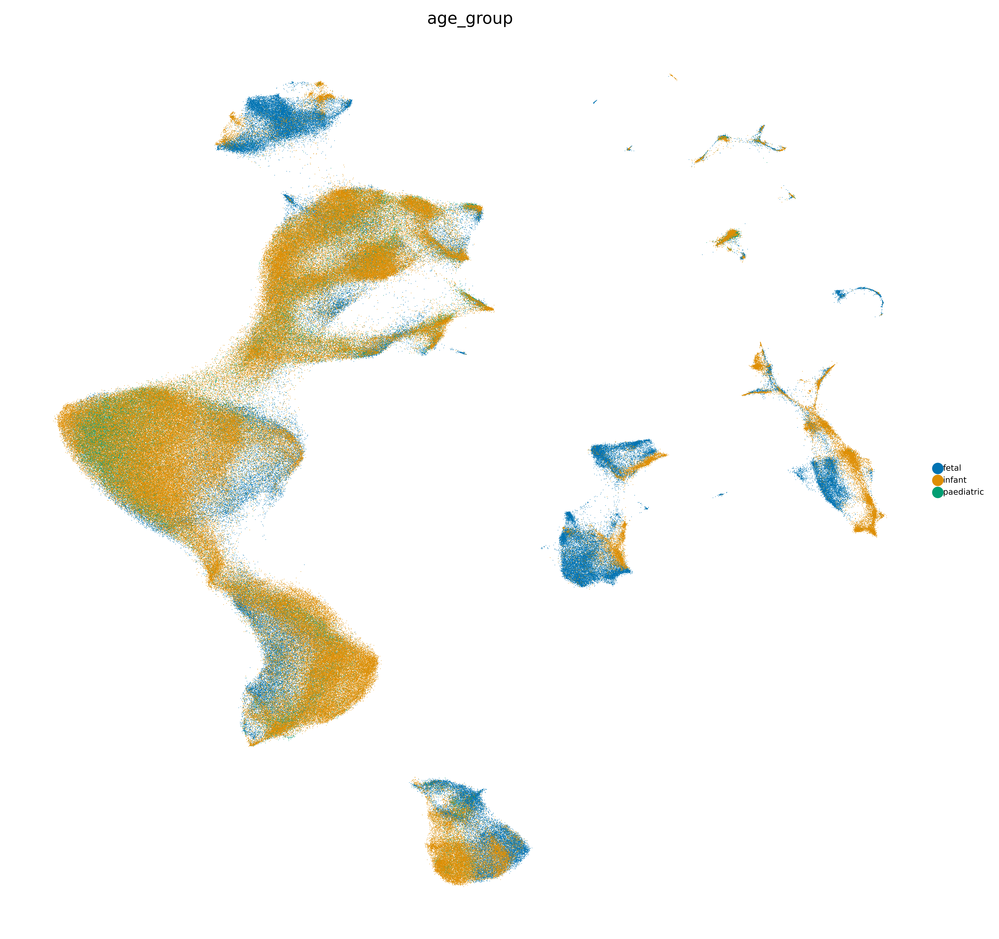

In [37]:
sc.set_figure_params(figsize=[10,10],fontsize=10,dpi=400)
import matplotlib as mpl
annotation = 'age_group'
ct_order = list(np.unique(adata_full.obs[annotation]))
ct_color_map = dict(zip(ct_order, np .array(sns.color_palette("colorblind", len(ct_order)))[range(len(ct_order))]))
# ct_color_map = dict(zip(ct_order, np .array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))

sc.pl.umap(adata_full, color=[annotation], legend_fontsize=5,s=0.5,legend_fontoutline=1,ncols=2,frameon=False,palette=ct_color_map,save = '_s1_'+annotation+'.pdf')

# read T CITE annotations 

In [92]:
h5ad_file = '/nfs/team205/ny1/ThymusSpatialAtlas/Figure5/Latest_version/Thymus_Atlas_v17_cite_Tv2.h5ad'
adata_full = sc.read_h5ad(h5ad_file)

In [52]:
sc.set_figure_params(figsize=[20,20],fontsize=10,dpi=600)
import matplotlib as mpl
ct_order = list(np.unique(adata.obs['anno_CITE_4v3']))
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("colorblind", len(ct_order)))[range(len(ct_order))]))
sc.pl.umap(adata, color=['anno_CITE_4v3'], legend_fontsize=5,s=1.5,legend_fontoutline=1,ncols=2,frameon=False,palette=ct_color_map,legend_loc='on data',save = 'save=anno_CITE_4v3.pdf')